![ga4](https://www.google-analytics.com/collect?v=2&tid=G-6VDTYWLKX6&cid=1&en=page_view&sid=1&dl=statmike%2Fvertex-ai-mlops%2FApplied+Optimization&dt=Vertex+AI+-+Vizier+Optimization+Service.ipynb)

# Vertex AI - Vizier Optimization Service

Vertex AI Vizier is an optimization service. It is used to optimize hyperparameters for machine learning models - called hyperparameter tuning.  It can also optimize any system that can be evaluated.  Even systems with multiple objectives.

In this demonstration, multiple objectives are set and the Vizier service is used to conduct a random search and a default search (Bayesian Optimization) for comparison.

**Resources:**
- [Vertex AI](https://cloud.google.com/vertex-ai/docs/start/introduction-unified-platform)
    - [Vertex AI Python SDK](https://cloud.google.com/python/docs/reference/aiplatform/latest)
    - [Vertex AI Vizier](https://cloud.google.com/vertex-ai/docs/vizier/overview)
        - [Creating Studies](https://cloud.google.com/vertex-ai/docs/vizier/using-vizier)
        - [Vizier Client](https://cloud.google.com/python/docs/reference/aiplatform/latest/google.cloud.aiplatform_v1.services.vizier_service)
        - Sample Notebooks:
            - [Optimize Multiple Objectives with Vertex AI Vizier](https://github.com/GoogleCloudPlatform/vertex-ai-samples/blob/main/notebooks/official/vizier/gapic-vizier-multi-objective-optimization.ipynb)
            - [Vizier and Open Source Vizier](https://github.com/GoogleCloudPlatform/vertex-ai-samples/blob/main/notebooks/community/vizier/conversions_vertex_vizier_and_open_source_vizier.ipynb)
        - Background:
            - [Original Publication](https://dl.acm.org/doi/pdf/10.1145/3097983.3098043)
            - [Open Source Vizier](https://arxiv.org/abs/2207.13676)
                - [Repository](https://github.com/google/vizier)

**Conceptual Flow & Workflow**

<p align="center">
  <img alt="Conceptual Flow" src="../architectures/slides/10_arch.png" width="45%">
&nbsp; &nbsp; &nbsp; &nbsp;
  <img alt="Workflow" src="../architectures/slides/10_console.png" width="45%">
</p>

---
## Colab Setup

To run this notebook in Colab click [![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/statmike/vertex-ai-mlops/blob/main/Applied%20Optimization/Vertex%20AI%20Vizier%20Optimization%20Service.ipynb) and run the cells in this section.  Otherwise, skip this section.

This cell will authenticate to GCP (follow prompts in the popup).

In [1]:
PROJECT_ID = 'statmike-mlops-349915' # replace with project ID

In [2]:
try:
    import google.colab
    from google.colab import auth
    auth.authenticate_user()
    !gcloud config set project {PROJECT_ID}
except Exception:
    pass

---
## Setup

### Package Installs (if needed)

This notebook uses [plotly](https://plotly.com/python/getting-started/) for interactive vizualizations. 

In [1]:
try:
    import plotly
except ImportError:
    print('You need to pip install plotly')
    !pip install plotly -q --user

This notebook also shows using the open-source version of Vizier.

In [2]:
try:
    import vizier
except ImportError:
    print('You need to pip install google-vizier')
    !pip install google-vizier[jax] -q --user

### Environment

inputs:

In [3]:
project = !gcloud config get-value project
PROJECT_ID = project[0]
PROJECT_ID

'statmike-mlops-349915'

In [4]:
REGION = 'us-central1'
EXPERIMENT = 'vizier'
SERIES = 'optimization'

packages:

In [5]:
from google.cloud import aiplatform
from vizier.service import clients

import plotly.graph_objects as go
import numpy as np
import time

clients:

In [7]:
vizier = aiplatform.gapic.VizierServiceClient(
    client_options = {"api_endpoint" : f"{REGION}-aiplatform.googleapis.com"}
)

parameters:

In [8]:
PARENT = f"projects/{PROJECT_ID}/locations/{REGION}"

---
## Challenge
Two functions: `blue`, `green`
What is the value of `r` and `theta` than minimizes `blue` while maximizing `green`?

In [9]:
r = np.linspace(0, 1, 100)
theta = np.linspace(0, np.pi/2, 100)

R, THETA = np.meshgrid(r, theta)

In [10]:
blue = R * np.sin(THETA)
green = R * np.cos(THETA)

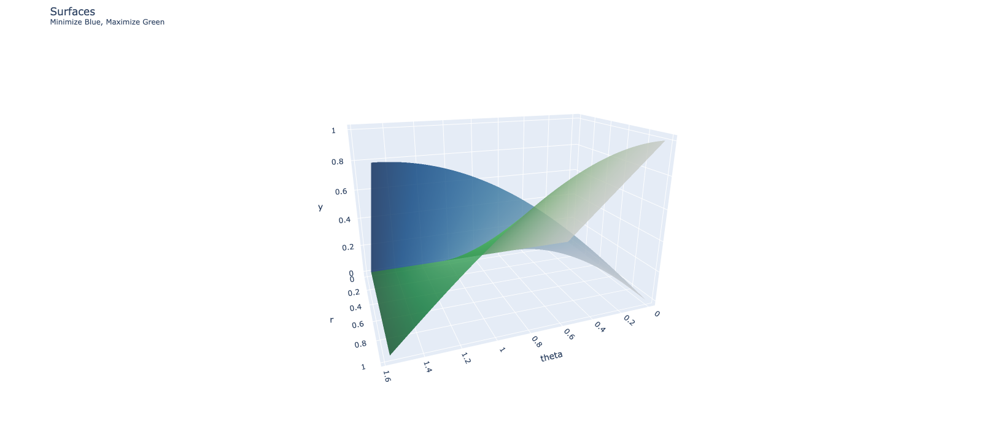

In [11]:
fig=go.Figure()
fig.add_trace(go.Surface(x=R, y=blue, z=THETA, showscale=False, opacity=0.8, colorscale='blues'))
fig.add_trace(go.Surface(x=R, y=green, z=THETA, showscale=False, opacity=0.8, colorscale='greens'))
fig.update_layout(
    title_text="Surfaces <br><sup>Minimize Blue, Maximize Green</sup>",
    scene =  dict(
        xaxis_title='r',
        yaxis_title='y',
        zaxis_title='theta'
    ),
    autosize=False,
    height=700,
    width=1200,
    margin=dict(r=10, l=10, b=50, t=50),
    scene_camera = dict(
        up=dict(x=0, y=1, z=0), # change from z=1 to y=1
        center=dict(x=0, y=0, z=0),
        eye=dict(x=2, y=.75, z=0.75) # default is 1.25 for all
    )
)

## Evaluations
Create a function that evaluates the metric for given parameter inputs

In [21]:
def metrics(r, theta):
    m1 = {
        "metric_id" : "blue",
        "value" : r * np.sin(theta)
    }
    m2 = {
        "metric_id" : "green",
        "value" : r * np.cos(theta)
    }
    return [m1, m2]

In [25]:
metrics(r[10], theta[10])

[{'metric_id': 'blue', 'value': 0.01595973696700504},
 {'metric_id': 'green', 'value': 0.09974130188650449}]

## Study Specifications
Define the `study_spec` and provide it to the Vizier client.  The `study_spec` contains the parameters, their value types and ranges, and the metric(s) with goals.

[Parameter Specs](https://googleapis.dev/python/aiplatform/latest/aiplatform_v1/types.html#google.cloud.aiplatform_v1.types.StudySpec.ParameterSpec) can also be [conditional](https://googleapis.dev/python/aiplatform/latest/aiplatform_v1/types.html#google.cloud.aiplatform_v1.types.StudySpec.ParameterSpec.conditional_parameter_specs)

In [26]:
parameters = [
    {
        "parameter_id" : "r",
        "double_value_spec" : {
            "min_value" : np.min(r),
            "max_value" : np.max(r)
        }
    },
    {
        "parameter_id" : "theta",
        "double_value_spec" : {
            "min_value" : np.min(theta),
            "max_value" : np.max(theta)
        }

    }
]

In [15]:
metrics = [
    {
        "metric_id" : "blue",
        "goal" : "MINIMIZE"
    },
    {
        "metric_id" : "green",
        "goal" : "MAXIMIZE" 
    }
]


---
## Create Study: Random Search

In [17]:
algorithm = "RANDOM_SEARCH"
study_spec = {
    "display_name" : f"Study_{SERIES}_{EXPERIMENT}_{algorithm}",
    "study_spec" : {
        "algorithm" : algorithm,
        "parameters" : parameters,
        "metrics" : metrics
    }
}

In [18]:
study_random = vizier.create_study(parent = PARENT, study = study_spec)

In [19]:
study_random.name, study_random.display_name

('projects/1026793852137/locations/us-central1/studies/3299387975276',
 'Study_optimization_vizier_RANDOM_SEARCH')

### Trials
Use a Python function to orchestrate a trial:
- for the `max_trials` continue iterating until the desired number has been reached
- From the Vizier trial, request sets (5) of parameter suggestion
    - Evaluate the metrics for the returned parameter suggestions
    - Add the metrics back to Vizier as trail results
- Repeat

In [15]:
def trial_runner(study, add_trials, max_trials, parallel_trials):
    # increase the number of trials by add_trials while not exceeding max_trials overall
    trial_iter = 0
    trial_count = len(vizier.list_trials({"parent":study.name}).trials)
    
    # setup timing
    if study.name not in timecheck:
        timecheck[study.name] = {}
        timecheck[study.name]['display_name'] = study.display_name
        timecheck[study.name]['trials'] = []
        time_start = time.perf_counter()
    else:
        time_base = timecheck[study.name]['trials'][-1]['complete_trials']
        time_start = time.perf_counter() - time_base
    
    # run trials
    while trial_count < max_trials and trial_iter < add_trials:
        time_request = time.perf_counter()
        batch_size = min(parallel_trials, max_trials-trial_count)
        suggestions = vizier.suggest_trials(
            {
                "parent": study.name,
                "suggestion_count" : batch_size,
                "client_id" : "client1"
            }
        ).result()
        time_receive = time.perf_counter()

        for s, suggestion in enumerate(suggestions.trials):
            if s == 0: trial_length = []
            trial_start = time.perf_counter()
            trial_count = int(suggestion.name.split("/")[-1])
            trial_iter += 1
            trial = vizier.get_trial({"name" : suggestion.name})

            if trial.state in ["COMPLETED", "INFEASIBLE"]:
                continue

            for param in trial.parameters:
                if param.parameter_id == "r": 
                    r = param.value
                elif param.parameter_id == "theta":
                    theta = param.value

            response = vizier.complete_trial(
                {
                    "name" : suggestion.name,
                    "final_measurement": {
                        "metrics": metrics(suggestion.name, r, theta)
                    },
                    "trial_infeasible": False
                }
            )
            trial_end = time.perf_counter()
            trial_length.append({'start': trial_start - time_start, 'end': trial_end - time_start})
        time_complete = time.perf_counter()
        
        # log timing
        timecheck[study.name]['trials'].append({
            'start_trial': trial_count-batch_size+1, 
            'end_trial': trial_count, 
            'batch_size': batch_size, 
            'request_suggestions': time_request-time_start, 
            'receive_suggestions': time_receive-time_start, 
            'complete_trials': time_complete-time_start,
            'trial_length': trial_length
        }
        )
    
    # plot timeline (so far)    
    timeliner(study)

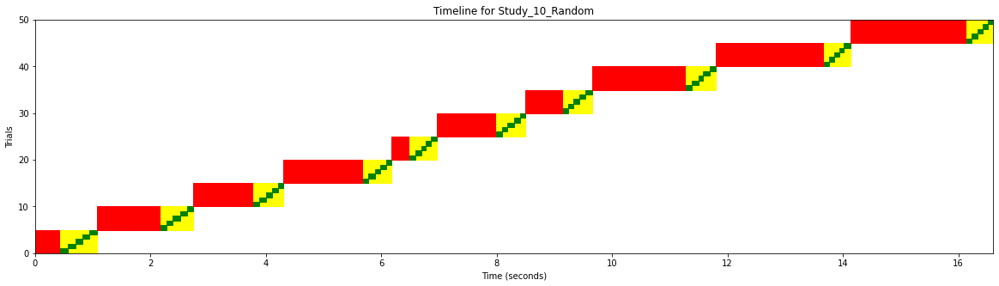

In [16]:
trial_runner(study_random, 50, 100, 5)

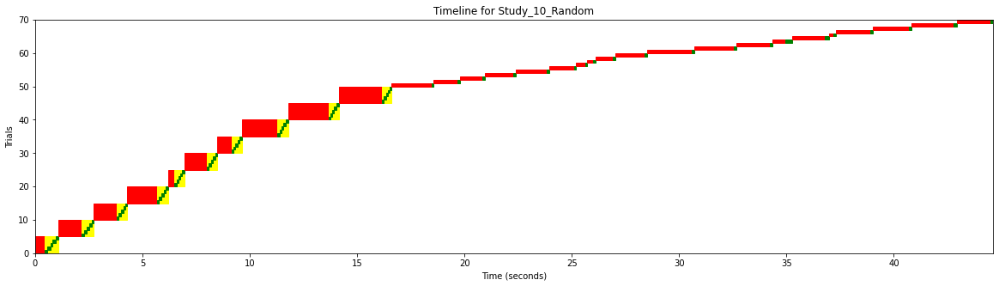

In [17]:
trial_runner(study_random, 20, 100, 1)

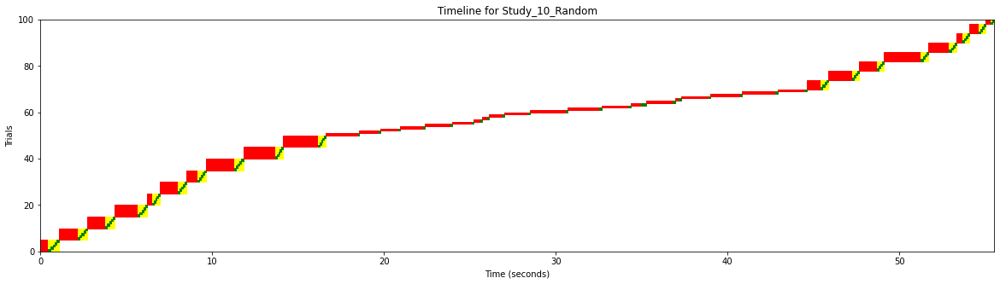

In [18]:
trial_runner(study_random, 30, 100, 4)

## Answers
Retrieve the trial results for all terations and plot

In [19]:
def plot_result(study):
    fig=go.Figure()
    fig.add_trace(go.Surface(x=R, y=blue, z=THETA, showscale=False, opacity=0.8, colorscale='blues'))
    fig.add_trace(go.Surface(x=R, y=green, z=THETA, showscale=False, opacity=0.8, colorscale='greens'))

    trials = vizier.list_trials({"parent": study.name})
    try_r = [x.parameters[0].value for x in trials.trials]
    try_theta = [x.parameters[1].value for x in trials.trials]
    try_blue = [x.final_measurement.metrics[0].value for x in trials.trials]
    try_green = [x.final_measurement.metrics[1].value for x in trials.trials]
    for i, j, k, h in zip(try_r, try_theta, try_blue, try_green):
        fig.add_trace(go.Scatter3d(x=[i,i], y=[k,h], z=[j,j], mode='lines+markers', line=dict(color="#ff0000"), marker=dict(size=5)))

    fig.update_layout(
        title_text="Surfaces <br><sup>Minimize Blue, Maximize Green</sup>",
        showlegend=False,
        scene =  dict(
            xaxis_title='r',
            yaxis_title='y',
            zaxis_title='theta'
        ),
        autosize=False,
        height=700,
        width=1200,
        margin=dict(r=10, l=10, b=50, t=50),
        scene_camera = dict(
            up=dict(x=0, y=1, z=0), # change from z=1 to y=1
            center=dict(x=0, y=0, z=0),
            eye=dict(x=2, y=.75, z=0.75) # default is 1.25 for all
        )
    )
    fig.show()

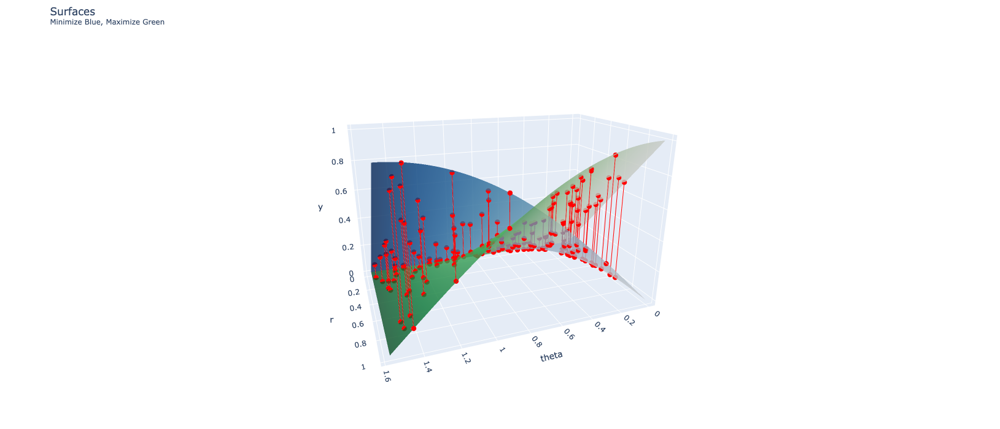

In [20]:
plot_result(study_random)

Optimal answer (so far ....):

In [21]:
def optimals(study):
    optimal_trials = vizier.list_optimal_trials({"parent": study.name})
    print("r = {}".format(optimal_trials.optimal_trials[-1].parameters[0].value))
    print("theta = {}".format(optimal_trials.optimal_trials[-1].parameters[1].value))
    print("blue = {}".format(optimal_trials.optimal_trials[-1].final_measurement.metrics[0].value))
    print("green = {}".format(optimal_trials.optimal_trials[-1].final_measurement.metrics[1].value))
    print("Trial ID = {}".format(optimal_trials.optimal_trials[-1].name.split("/")[-1]))

In [22]:
optimals(study_random)

r = 0.9837872751983933
theta = 0.30559649120325216
blue = 0.2959842889135147
green = 0.9382061093164125
Trial ID = 98


## Vizier Algorithm
Use the functions defined above to request a new study that uses the default method in Vizier = Bayesian Optimization.

In [23]:
study_vizier = make_study("ALGORITHM_UNSPECIFIED", "Bayesian_Optimization") # unspecified means use the default = Vizier

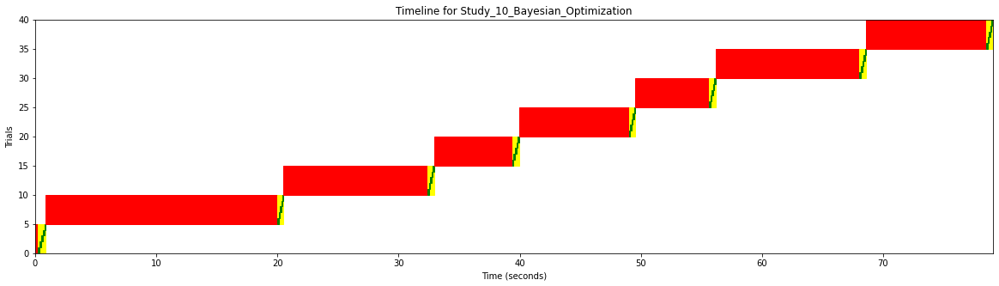

In [24]:
trial_runner(study_vizier, 40, 100, 5)

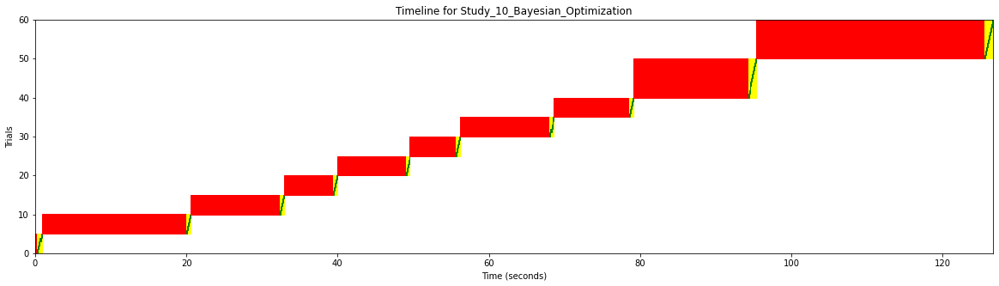

In [25]:
trial_runner(study_vizier, 20, 100, 10)

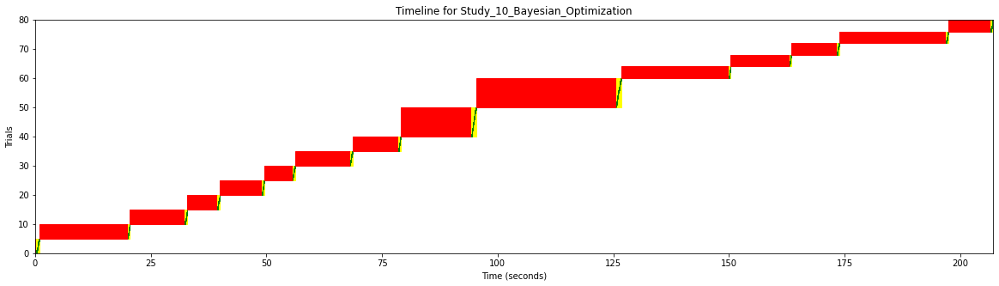

In [26]:
trial_runner(study_vizier, 20, 100, 4)

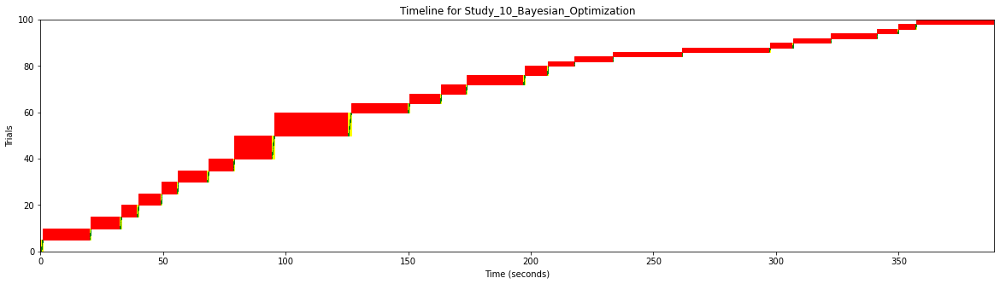

In [27]:
trial_runner(study_vizier, 20, 100, 2)

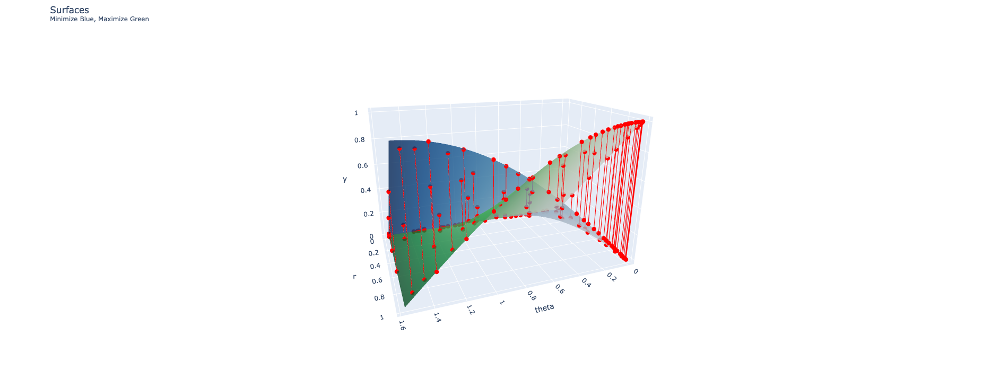

In [28]:
plot_result(study_vizier)

In [30]:
optimals(study_vizier)

r = 1.0
theta = 0.0
blue = 0.0
green = 1.0
Trial ID = 5


---
## Manage Studies

In this project we created two studies.  This section show how to list studies

In [31]:
vizier.list_studies(parent=PARENT)

ListStudiesPager<studies {
  name: "projects/1026793852137/locations/us-central1/studies/286694434427"
  display_name: "Study_10_Bayesian_Optimization"
  study_spec {
    metrics {
      metric_id: "blue"
      goal: MINIMIZE
    }
    metrics {
      metric_id: "green"
      goal: MAXIMIZE
    }
    parameters {
      parameter_id: "r"
      double_value_spec {
        max_value: 1.0
      }
    }
    parameters {
      parameter_id: "theta"
      double_value_spec {
        max_value: 1.5707963267948966
      }
    }
  }
  state: ACTIVE
  create_time {
    seconds: 1660756039
  }
}
studies {
  name: "projects/1026793852137/locations/us-central1/studies/3751628408782"
  display_name: "Study_10_Random"
  study_spec {
    metrics {
      metric_id: "blue"
      goal: MINIMIZE
    }
    metrics {
      metric_id: "green"
      goal: MAXIMIZE
    }
    parameters {
      parameter_id: "r"
      double_value_spec {
        max_value: 1.0
      }
    }
    parameters {
      parameter_id: "

---
## Remove Resources
see notebook "99 - Cleanup"